# Лабораторная работа №2. Дискретные LTI системы.

__Вариант 6__

Лаборатория цифровой обработки сигналов, ФРКТ МФТИ


Дискретные LTI системы (англ. Linear time-invariant system) — линейные стационарные дискретные системы.

In [2]:
import numpy as np
import matplotlib.pyplot as plt 
import scipy as sp
import time

In [3]:
np.random.seed(42)

In [4]:
def DTFT(x, N=2**10):
    return np.linspace(-0.5, 0.5-1/N, N), np.fft.fftshift(np.fft.fft(x, N))

# Модуль 1. Линейная дискретная свертка.

## Задача 1.1. Линейная дискретная свертка прямоугольных окон 



| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 |    7 |    8 |    9 |    10 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
|    $M$    | 4 | 5 | 6 | 4 | 5 | 6 | 8 | 7 | 8 | 7 |

Вычислить аналитически линейную дискретную свертку двух одинаковых последовательностей $x[k]$ и $h[k]$, таких, что 
$$x[k]=h[k]=\sum_{m=0}^{M-1}\mathbf{1} [k-m], $$ 
где $M$ соответствует варианту, непосредственно воспользовавшись формулой линейной дискретной свертки
$$y[k]=\sum_{m=-\infty}^{\infty} x[m] h[k-m].$$

Проверить результаты с помощью моделирования, воспользовавшись функцией `signal.convolve`

In [5]:
M = 6

### Аналитическая формула

\begin{equation*} 
\begin{aligned}
& y[k]=\sum_{m=-\infty}^{\infty} x[m] h[k-m] = \sum_{m=-\infty}^{\infty} \left[ \sum_{n=0}^{M-1}\mathbf{1} [(m)-n] \sum_{l=0}^{M-1} \mathbf{1} [(k-m)-l] \right] = \sum_{m=0}^{M-1} \left[ \sum_{n=0}^{M-1}\mathbf{1} [(m)-n] \sum_{l=0}^{M-1} \mathbf{1} [(k-m)-l] \right] = \\

& \mathbf{1}[k] + 2 \cdot \mathbf{1}[k-1] + 3 \cdot \mathbf{1}[k-2] + ... + 6 \cdot \mathbf{1}[k-5] + ... + 2 \cdot \mathbf{1}[k-9] + 1 \cdot \mathbf{1}[k-10]
\end{aligned}
\end{equation*} 

In [6]:
y_an = np.hstack(([i for i in range(1, M)], [i for i in range(M, 0, -1)]))

### Моделирование

In [7]:
x = np.ones(M)
h = np.ones(M)

y_num = np.convolve(x, h, mode='full')

Резултаты совпадают:

In [8]:
np.all(y_an == y_num)

True

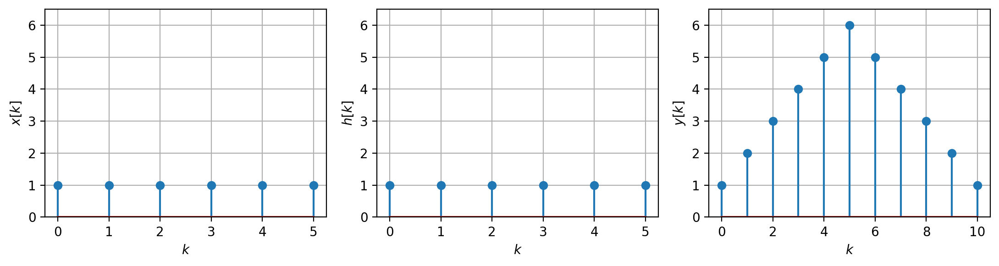

In [9]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(11, 3), dpi=200)
ax = ax.flatten()

y_lim = max(y_num) + 0.5
for i, (signal, name) in enumerate(zip([x, h, y_num], ['$x[k]$','$h[k]$', '$y[k]$'])):
    ax[i].stem(signal)
    ax[i].set_xlabel("$k$")
    ax[i].set_ylabel(name )
    ax[i].grid()
    ax[i].set_ylim([0, y_lim])

plt.tight_layout()
plt.show()

## Задача 1.2. Эффективное вычисление свертки 

| Варианты: |   $1$ |    $2$ |    $3$ |    $4$ |    $5$ |    $6$ |    $7$ |    $8$ |    $9$ |    $10$ |  
|:---------:|:----:|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|
|    $N$    | $2^{17}$ | $2^{18}$ | $2^{17}$ | $2^{18}$ | $2^{17}$ | $2^{18}$ | $2^{17}$ | $2^{18}$ | $2^{17}$ | $2^{18}$ |
|$n_0$| $128$ | $32$ | $256$ | $64$ | $512$ | $1024$ | $230$ | $325$ | $501$ | $1000$ |

Даны последовательности отсчетов
$$ x[k]= \cos(2\pi kn_0/N)$$  
$$ h[k]= \sin(2\pi kn_0/N)$$  
где $n_0$, $N$ взять из таблицы сверху в соответствии с вариантом и $k$ пробегает значения от $0$ до $N-1.$  
Вычислить их линейную дискретную свертку c помощью `signal.convolve()` двумя способами: с помощью прямого вычисления по формуле свёртки и с использованием алгоритма БПФ.  
Сравнить вычислительную эффективность, сделать вывод. 

P.S. На вычисление свертки по формуле может потребоваться значительное колличество времени. 



In [10]:
N = 2**18
n0 = 2**10

k = np.arange(N)
x = np.cos(2*np.pi*k*n0/N)
h = np.sin(2*np.pi*k*n0/N)

y_conv_direct = sp.signal.convolve(x, h, method='direct')
y_conv_fft = sp.signal.convolve(x, h, method='fft')

In [10]:

# %%timeit -r 7 -n 10
# sp.signal.convolve(x, h, method='direct')

## 5.46 s ± 176 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)

In [11]:

# %%timeit -r 7 -n 10
# sp.signal.convolve(x, h, method='fft')

## 23.3 ms ± 950 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)

# Модуль 2. Характеристики LTI систем.






## Задача 2.1. Фильтр скользящего среднего

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 |    7 |    8 |    9 |    10 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
|$M_1$|  9 | 14 | 13 |  9 | 12 |  11 | 14 | 13 |  9 | 12 |
|$M_2$| 29 | 50 | 40 | 24 | 50 |  45 | 50 | 40 | 24 | 50 |
| $K$ | 35 | 63 | 57 | 35 | 63 |  55 | 63 | 57 | 35 | 63 |
| $N$ |100 |140 |130 |100 |140 | 115 |140 | 130 | 100 | 140 |

Рассмотрите фильтр скользящего среднего

$$y[k]=\dfrac{1}{M}\sum_{m=0}^{M-1} x[k-m]$$

для $M = M_1$ и $M = M_2$ (из таблицы): 



In [12]:
M1 = 11
M2 = 45
K = 55
N = 115

M = max(M1, M2)



* Определите и изобразите импульсную характеристику $h[k]$ фильтра.

In [13]:
k = np.arange(M)
h1 = np.ones(M1) / M1
h2 = np.ones(M2) / M2

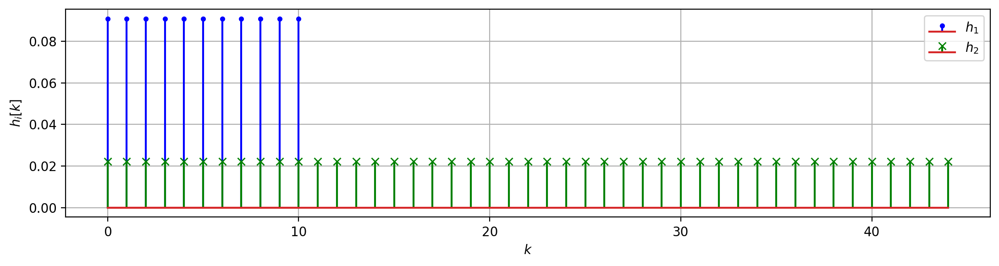

In [14]:
fig, ax = plt.subplots(figsize=(11, 3), dpi=200)
plt.stem(h1, linefmt='b', markerfmt='b.', label='$h_1$')
plt.stem(h2, linefmt='g', markerfmt='gx', label='$h_2$')
plt.xlabel("$k$")
plt.ylabel("$h_i[k]$")
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()



* Вычислите с помощью `signal.convolve` отклик $y[k]$ фильтра на входное воздействие вида
$$ x_{noise}[k] = \sin(2\pi k / K) + \varepsilon[k], 0\le k\le N-1.$$
где $K,\;N$ — соответствующие числа из таблицы, $\varepsilon[k]$ — белый гаусовский шум (`np.random.normal(mu, sigma, N)`) с нулевым среднем `mu=0` и  среднеквадратическим отклонением $\sigma=0.1$ (`sigma=0.1`).  


In [15]:
k = np.arange(N)

mu = 0
sigma = 0.1

x = np.sin(2*np.pi*k/K)
x_noise = x + np.random.normal(mu, sigma, size=N)

y1 = np.convolve(x_noise, h1, mode='full')
y2 = np.convolve(x_noise, h2, mode='full')


* Сравните сигналы $x_{noise}[k]$, $y[k]$ и 
$ x[k] = \sin(2\pi k / K), 0\le k\le N-1.$


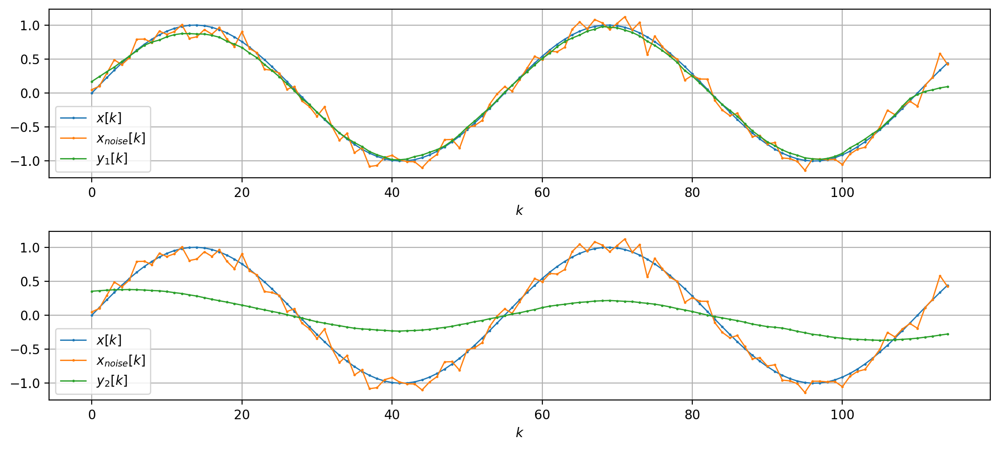

In [16]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(11, 5), dpi=200)
ax = ax.flatten()
ax[0].plot(x, marker='.', ms=2, lw=1, label='$x[k]$')
ax[0].plot(x_noise, marker='.', ms=2, lw=1,  label='$x_{noise}[k]$')
ax[0].plot(y1[M1//2:-(M1//2)], marker='.', ms=2, lw=1, label='$y_1[k]$')  # убираем задержку M1//2
ax[0].set_xlabel("$k$")
ax[0].grid()
ax[0].legend()

ax[1].plot(x, marker='.', ms=2, lw=1,  label='$x[k]$')
ax[1].plot(x_noise, marker='.', ms=2, lw=1,  label='$x_{noise}[k]$')
ax[1].plot(y2[M2//2:-(M2//2)], marker='.', ms=2, lw=1,  label='$y_2[k]$')  # убираем задержку M2//2
ax[1].set_xlabel("$k$")
ax[1].grid()
ax[1].legend()


plt.tight_layout()
plt.show()


* Определите и изобразите амплитудно-частотную характеристику (АЧХ) $|H(\nu)|$ фильтра. Как выбор $M$ влияет на результат фильтрации отрезка гармонического сигнала?

In [17]:
N_dtft = 2**16

nu, X = DTFT(x, N=N_dtft)
_, X_noise = DTFT(x_noise, N=N_dtft)
_, H1 = DTFT(h1, N=N_dtft)
_, H2 = DTFT(h2, N=N_dtft)
_, Y1 = DTFT(y1, N=N_dtft)
_, Y2 = DTFT(y2, N=N_dtft)

In [18]:
max(X)

(43.41959175870691-16.67866295387546j)

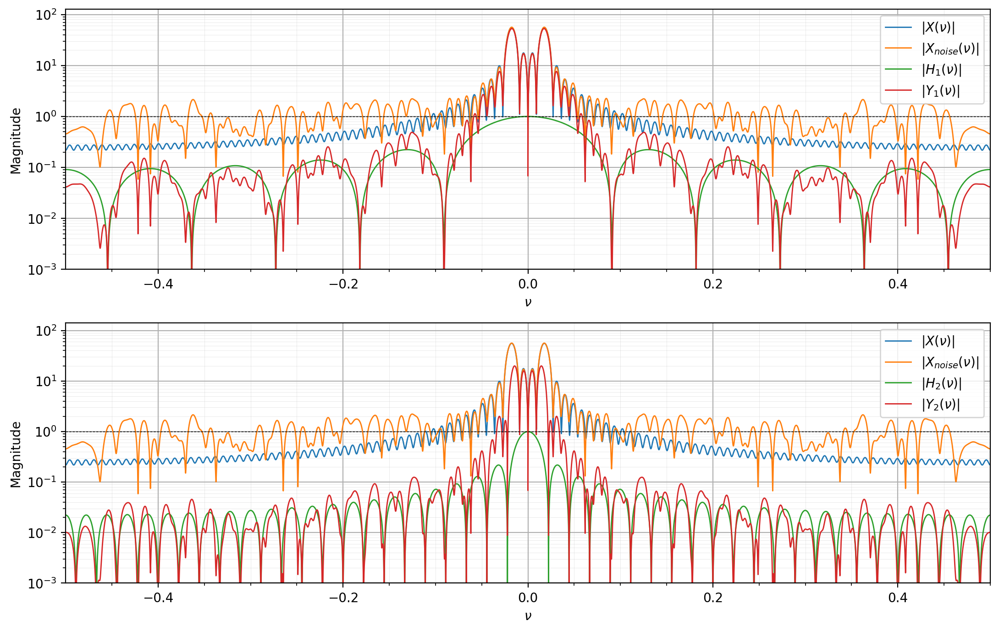

In [19]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(11, 7), dpi=200)
ax = ax.flatten()

ax[0].semilogy(nu, np.abs(X), lw=1, label='$|X(\\nu)|$')
ax[0].semilogy(nu, np.abs(X_noise), lw=1,  label='$|X_{noise}(\\nu)|$')
ax[0].semilogy(nu, np.abs(H1), lw=1, label='$|H_1(\\nu)|$')
ax[0].semilogy(nu, np.abs(Y1), lw=1, label='$|Y_1(\\nu)|$')
ax[0].hlines(xmin=min(nu), xmax=max(nu), y=1, lw=0.5, ls='--', color='k')
ax[0].set_ylabel("Magnitude")
ax[0].set_xlabel("$\\nu$")
ax[0].set_xlim([-0.5, 0.5])
ax[0].set_ylim([1e-3, None])
ax[0].grid(True, which='major')
ax[0].grid(True, which='minor', lw=0.3, alpha=0.3)
ax[0].minorticks_on()
ax[0].legend()

ax[1].semilogy(nu, np.abs(X), lw=1, label='$|X(\\nu)|$')
ax[1].semilogy(nu, np.abs(X_noise), lw=1,  label='$|X_{noise}(\\nu)|$')
ax[1].semilogy(nu, np.abs(H2), lw=1, label='$|H_2(\\nu)|$')
ax[1].semilogy(nu, np.abs(Y2), lw=1, label='$|Y_2(\\nu)|$')
ax[1].hlines(xmin=min(nu), xmax=max(nu), y=1, lw=0.5, ls='--', color='k')
ax[1].set_ylabel("Magnitude")
ax[1].set_xlabel("$\\nu$")
ax[1].set_xlim([-0.5, 0.5])
ax[1].set_ylim([1e-3, None])
ax[1].grid(True, which='major')
ax[1].grid(True, which='minor', lw=0.3, alpha=0.3)
ax[1].minorticks_on()
ax[1].legend()

plt.tight_layout()
plt.show()

## Задача 2.2. Двухкаскадный фильтр

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 |   7 |    8 |    9 |    10 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
| $a$ |  1 |  1 |  1 |  1 |  1 |  1 |  1 |  1 |  1 |  1 |
| $b$ |0.8 |0.7 |0.6 |0.8 |0.7 |0.6 |0.6 |0.8 |0.7 |0.6 |
| $c$ |0.5 |0.4 |0.3 |0.5 |0.3 |0.4 |0.3 |0.5 |0.3 |0.4 |
| $M$ | 50 | 60 | 50 | 50 | 50 | 60 | 50 | 50 | 50 | 60 |
| $N$ |180 |200 |220 |180 |200 |220 |220 |180 |200 |220 |

Рассмотрите двухкаскадный фильтр, каскады которого задаются следующими разностными уравнениями. 

1) $$y[k]=\dfrac{ax[k]+bx[k-M]+cx[k-2M]}{a+b+c}$$

где $a$, $b$, $c$ и $M$ заданы в таблице с вариантами.

2) $$y[k]=\dfrac{x[k]+x[k-1]}{2}.$$

Подайте на вход такого  фильтра любой сгенерированный сигнал $x[k]$ длительностью $N$ отсчетов. Измениться ли выход системы от перестановки порядка каскадов? Проведите моделирование с использованием функции `signal.convolve`

In [20]:
a = 1
b = 0.6
c = 0.4
M = 60
N = 220

In [21]:
h1 = np.zeros(2*M + 1)
h1[0]   = a / (a + b + c)
h1[M]   = b / (a + b + c) 
h1[2*M] = c / (a + b + c)

In [22]:
h2 = np.array([0.5, 0.5])

In [23]:
htot = np.convolve(h1, h2)

In [24]:
mu = 0
sigma = 1
x = np.random.normal(loc=mu, scale=sigma, size=N)

$ y_{12} = h_2 \circledast (h_1 \circledast x) $

$ y_{21} = h_1 \circledast (h_2 \circledast x) $

$ y_{\text{tot}} = h_{\text{tot}} \circledast x = (h_1 \circledast h_2) \circledast x $

In [25]:
y12 = np.convolve(h1, np.convolve(h2, x))
y21 = np.convolve(h2, np.convolve(h1, x))
ytot = np.convolve(htot, x)

Результаты совпадают

In [26]:
np.allclose(y12, y21), np.allclose(y12, ytot), np.allclose(y21, ytot)

(True, True, True)

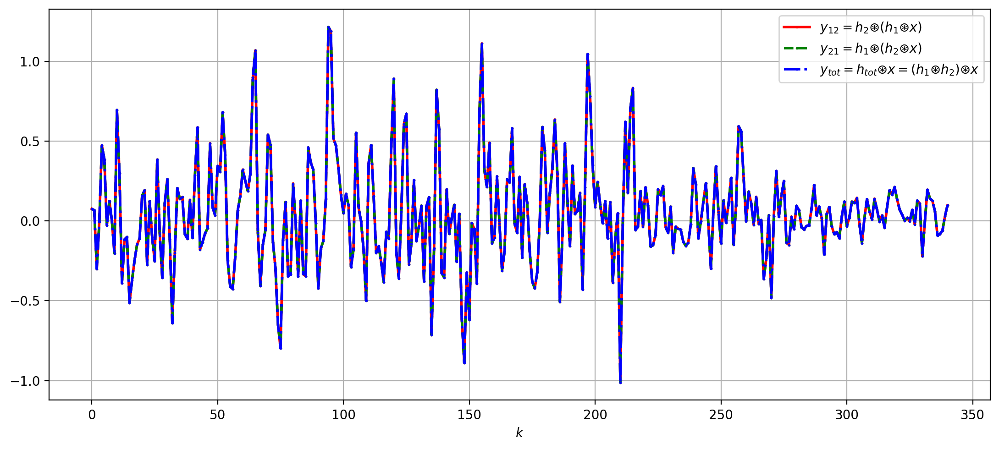

In [27]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(11, 5), dpi=200)
ax.plot(y12, marker='.', ms=2, lw=2, ls='-', color='r', label='$ y_{12} = h_2 \circledast (h_1 \circledast x) $')
ax.plot(y21, marker='.', ms=2, lw=2, ls='--', color='g',label='$ y_{21} = h_1 \circledast (h_2 \circledast x) $')
ax.plot(ytot, marker='.', ms=2, lw=2, ls='-.', color='b',label='$y_{{tot}} = h_{{tot}} \circledast x = (h_1 \circledast h_2) \circledast x$') 
ax.set_xlabel("$k$")
ax.grid()
ax.legend()
plt.tight_layout()
plt.show()

# Модуль 3. Аппроксимация идеальных частотно-избирательных фильтров и явление Гиббса

## Задача 3.1. Явление Гиббса для каузальной аппроксимации ИФНЧ

| Варианты: |   1 |    2 |    3 |    4 |    5 |    6 |   7 |    8 |    9 |    10 | 
|:---------:|----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|-----:|
|  $\nu_c$  |0.1 |0.2 |0.3 |0.1 |0.2 |0.3 |0.2 |0.3 |0.1 | 0.2 |
|    $N$    | 30 | 20 | 30 | 20 | 30 | 20 | 24 | 22 | 26 | 28 |

Рассмотрите фильтр с импульсной характеристикой
$$
h[k] =
\left\{\begin{array}{l}
\dfrac{\sin(2\pi\nu_c (k-N))}{\pi (k-N)}, 0\le k \le 2N-1
\\
0, \; \text{при других } k.
\end{array}\right.
$$
для случая $\nu_c,\; N$ из варианта. 

Вычислите с помощью моделирования и постройте график АЧХ этого фильтра.  
Как изменяется АЧХ с ростом $N$ при фиксированной частоте среза $\nu_c$?

In [28]:
nu_c = 0.3
N = 20

N_dtft = 2**16

In [29]:
def h_sinc(k, nu_c, N):
    if k != N:
        return np.sin(2*np.pi*nu_c*(k-N)) / (np.pi*(k-N))
    else:
        return 2*nu_c

In [30]:
k = np.arange(2*N)
h = np.array([h_sinc(ki, nu_c, N) for ki in k])

nu, H = DTFT(h, N_dtft)

In [31]:
k2 = np.arange(4*N)
h2 = np.array([h_sinc(ki, nu_c, 2*N) for ki in k2])

k4 = np.arange(8*N)
h4 = np.array([h_sinc(ki, nu_c, 4*N) for ki in k4])

In [32]:
np.all(h == h2[N:-N]), np.all(h == h4[3*N:-3*N])

(True, True)

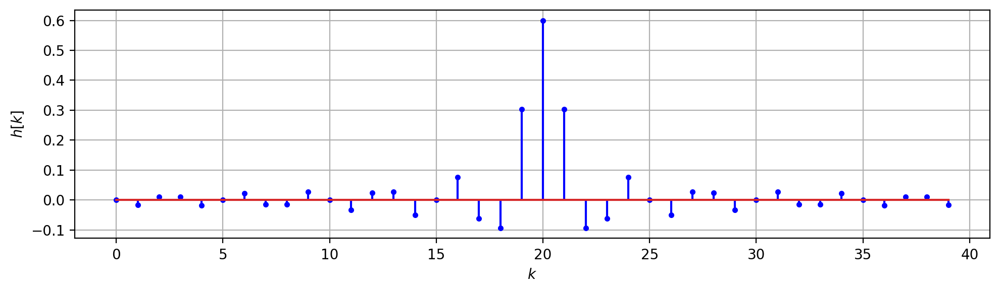

In [33]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 3), dpi=200)
ax.stem(h, linefmt='b', markerfmt='b.', label='N')
ax.set_xlabel("$k$")
ax.set_ylabel("$h[k]$")
ax.grid()

plt.tight_layout()
plt.show()

In [34]:
dict_ideal_H = {-0.5:0, -nu_c:0, 0:1, nu_c:1, 0.5:0}

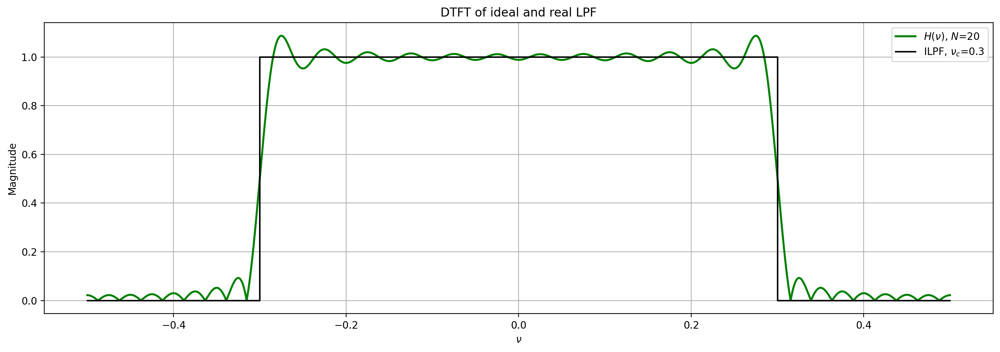

In [35]:
plt.figure(figsize=(14, 5), dpi=200)

plt.plot(nu, abs(H), lw = 2, color="g", label = f'$H(\\nu)$, $N$={N}')
plt.step(dict_ideal_H.keys(), dict_ideal_H.values(), color='k', label = f'ILPF, $\\nu_c$={nu_c}')
plt.title('DTFT of ideal and real LPF')
plt.xlabel("$\\nu$")
plt.ylabel("Magnitude")
plt.legend(loc="best")
plt.grid()

plt.tight_layout()
plt.show()

## Задача 3.2.  Аппроксимация фильтра с заданной частотной характеристикой с помощью ДВПФ   

Определить импульсную характеристику $h_{ideal}[k]$ фильтра, частотная характеристика которого является действительной функцией частоты и представлена на рисунке. 

Рассмотреть фильтр, импульсная характеристика которого в отличии от $h_{ideal}[k]$  усечена до $2N$ отсчетов и __сдвинута на $N$ отсчетов вправо__. С помощью моделирования определить и построить график АЧХ. Сравнить АЧХ обоих фильтров.

Рисунок генерируется с помощью функции `task_3_2(variant)` (приведенной ниже), где `variant` – номер варианта. 

In [36]:
def task_3_2(variant):
    nu_c1 = [0.2, 0.15, 0.15, 0.1, 0.15, 0.15, 0.2, 0.15, 0.15, 0.1]
    amp1 = [1,  0, 0.2, 1, 1, 0.6, 0.3, 0.2, 1, 1]
    nu_c2 = [0.4, 0.35, 0.4,  0.3,  0.35,  0.4, 0.4,  0.3,  0.35,  0.4]
    amp2 = [0.4, 1, 1, 0.4, 0.7,  1, 1, 1, 0.4, 0.7]
    def H_val(nu, n):
        return amp1[n] if abs(nu)<=nu_c1[n] else amp2[n] if abs(nu)<=nu_c2[n] else 0.0
    nu=np.arange(-0.5, 0.5, 0.001)
    plt.figure(figsize=[6, 2], dpi=140)
    plt.plot(nu, [H_val(x, variant-1) for x in nu] ,'g-')
    plt.xticks([-0.5, -nu_c2[variant-1], -nu_c1[variant-1], 0, nu_c1[variant-1], nu_c2[variant-1], 0.5])
    plt.grid()
    plt.yticks([0, min(amp1[variant-1],amp2[variant-1]), 1])
    plt.xlim([-0.5, 0.5])
    plt.xlabel("Нормированнная частота, $\\nu$")
    plt.ylabel("$H(\\nu)$")
    plt.title("Вариант %i" %variant)
    plt.tight_layout()
    plt.show()

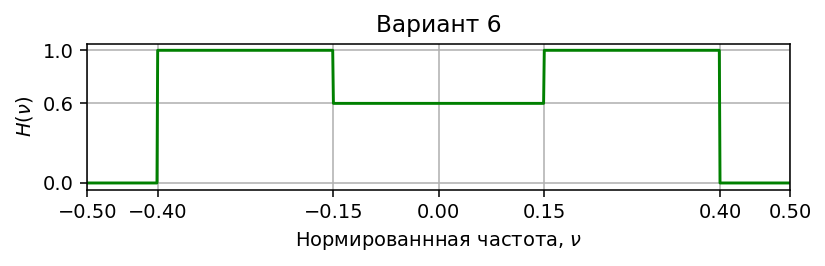

In [37]:
task_3_2(variant=6)


\begin{align*}
& H(\nu) = 
\begin{cases}
1,\; \nu \in [-\nu_c,\; \nu_c]
\\
0,\; \text{else}
\end{cases} 
\\
& h_0[k] = \int\limits_{-0.5}^{0.5} H(\nu) e^{2\pi j \nu k} d\nu = \left( \frac{e^{2\pi j \nu k}}{2\pi j k} \right)_{\nu=-\nu_c}^{\nu_c} =\frac{\sin(2\pi \nu_c k)}{\pi k}
\\
& h_1[k] = \frac{\sin(2\pi 0.4 k)}{\pi k} \\
& h_2[k] = 0.4 \cdot \frac{\sin(2\pi 0.15 k)}{\pi k}\\
& h[k] = h_1[k] - h_2[k] = \frac{\sin(2\pi 0.4 k)}{\pi k} - 0.4 \cdot \frac{\sin(2\pi 0.15 k)}{\pi k}
\end{align*}


In [38]:
dict_ideal_H = {-0.5:0, -0.4:0, -0.15:1, 0.15:0.6, 0.4:1, 0.5:0}

In [39]:
N = 30
N_dtft = 2**16
k = np.arange(2*N)

h_real = np.array([1. * h_sinc(ki, 0.4, N) - 0.4 * h_sinc(ki, 0.15, N) for ki in k])

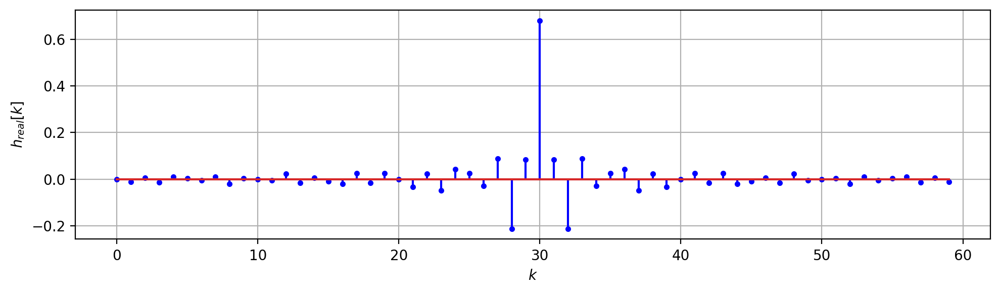

In [40]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 3), dpi=200)
ax.stem(h_real, linefmt='b', markerfmt='b.', label='N')
ax.set_xlabel("$k$")
ax.set_ylabel("$h_{real}[k]$")
ax.grid()

plt.tight_layout()
plt.show()

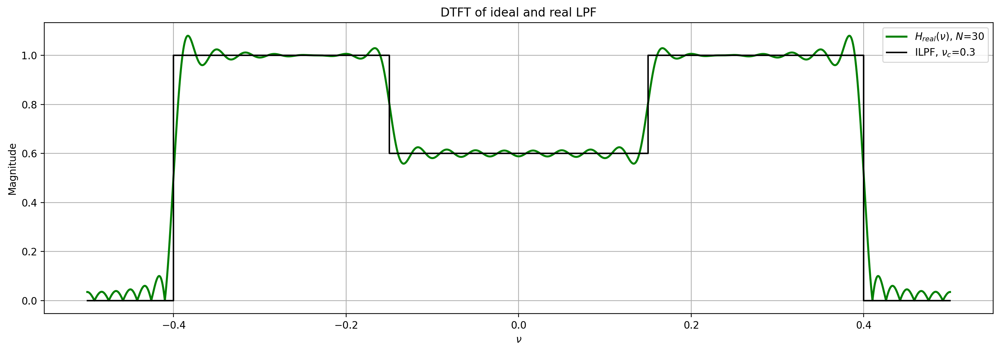

In [41]:
nu, H_real = DTFT(h_real, N_dtft) 

plt.figure(figsize=(14, 5), dpi=200)

plt.plot(nu, abs(H_real), lw=2, color="g", label = f'$H_{{real}}(\\nu)$, $N$={N}')
plt.step(dict_ideal_H.keys(), dict_ideal_H.values(), color='k', label = f'ILPF, $\\nu_c$={nu_c}')
plt.title('DTFT of ideal and real LPF')
plt.xlabel("$\\nu$")
plt.ylabel("Magnitude")
plt.legend(loc="best")
plt.grid()

plt.tight_layout()
plt.show()

In [54]:
from matplotlib import animation
from IPython.display import HTML

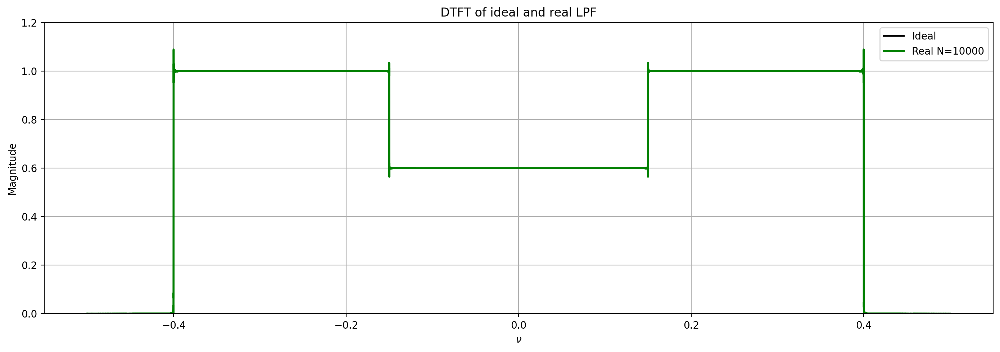

In [55]:
N_series = np.hstack((np.arange(0, 50, 1), np.arange(50, 1001, 50), np.arange(1000, 10001, 1000)))

fig, ax = plt.subplots(figsize=(14, 5), dpi=200)
ax.step(dict_ideal_H.keys(), dict_ideal_H.values(), color='k', label = f'Ideal')
gibbs_plot,  = plt.plot([], [], color='g', lw=2)
plt.title('DTFT of ideal and real LPF')
plt.xlabel("$\\nu$")
plt.ylabel("Magnitude")
plt.legend(loc="best")
plt.grid()
plt.tight_layout()

all_plots = np.zeros((N_dtft, len(N_series)), dtype=np.complex128)

for i, n in enumerate(N_series):
    k = np.arange(2 * n)
    nu, all_plots[:, i] = DTFT(np.array([1. * h_sinc(ki, 0.4, n) - 0.4 * h_sinc(ki, 0.15, n) for ki in k]), N_dtft)

def init():
    ax.set_ylim([0, 1.2])
    return all_plots[:, 0]

def animate(it):
    gibbs_plot.set_data(nu, abs(all_plots[:, it]))
    gibbs_plot.set_label(f'Real N={N_series[it]}')
    plt.legend()
    return gibbs_plot

anim = animation.FuncAnimation(fig, func=animate, init_func=init, frames=len(N_series), interval=100, blit=False, repeat=False)
HTML(anim.to_jshtml())